In [2]:
from data.nc import NcDataset
import matplotlib.pyplot as plt
%matplotlib inline
import torch
from torch.utils.data import DataLoader

In [3]:
train_dataset = NcDataset(is_train=True,
                        root='./data/',
                        n_frames_input=6,
                        n_frames_output=6)
batch_size = 5
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

Loaded 800 samples (train)


torch.Size([5, 6, 1, 64, 64]) torch.Size([5, 6, 1, 64, 64]) tensor(2.3832, device='cuda:0') tensor(0., device='cuda:0')


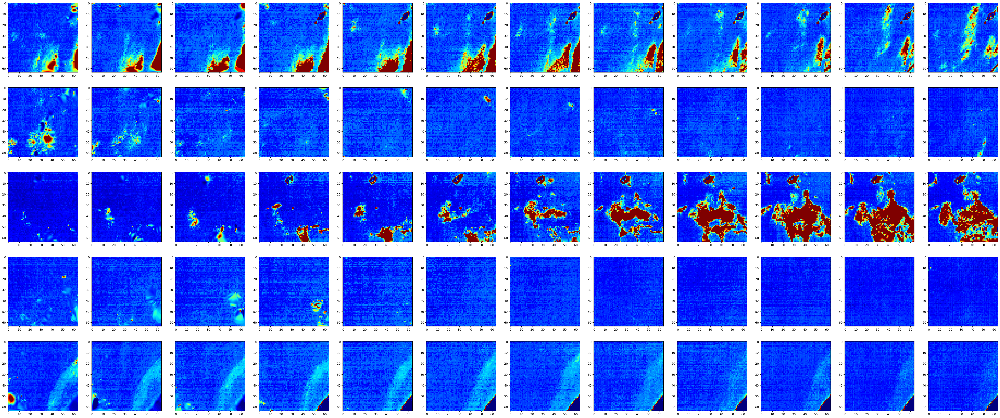

In [4]:
import numpy as np
# choose device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
for batch_idx, (i, targets, inputs) in enumerate(train_loader):
    inputs = inputs.float().to(device)
    targets = targets.float().to(device)
    print(inputs.shape, targets.shape, inputs.max(), inputs.min())
    images = torch.cat([inputs, targets], dim=1)
    _, axarr = plt.subplots(images.shape[0], images.shape[1], figsize=(images.shape[1]*batch_size, images.shape[0]*batch_size))
    for b in range(images.shape[0]):
        for n in range(images.shape[1]):
            plot_img = images[b, n, 0].cpu().numpy()
            axarr[b][n].imshow(np.flip(plot_img, axis=0), cmap='jet', vmin=0, vmax=0.2)
    break

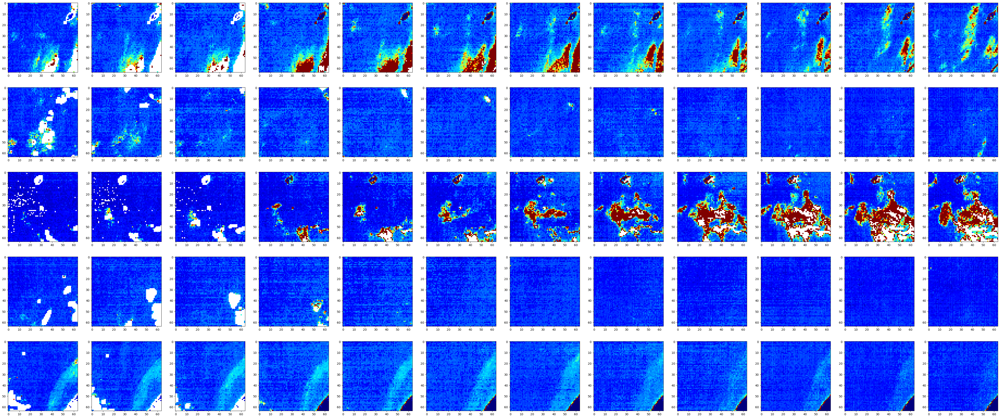

In [5]:
# plot original (not interpolated) data by directly reading with xarray
import xarray as xr

ds = xr.open_dataset('data/saved_aod_2023.nc')

fig, ax = plt.subplots(batch_size, 12, figsize=(12*batch_size, batch_size*batch_size))

for b in range(batch_size):
    for n in range(12):
        plot_img = ds['aod'][b*12+n].values
        ax[b][n].imshow(np.flip(plot_img, axis=0), cmap='jet', vmin=0, vmax=0.2)

plt.show()
ds.close()

Loaded 300 samples (valid)
torch.Size([5, 6, 1, 64, 64]) torch.Size([5, 6, 1, 64, 64]) tensor(1.6348, device='cuda:0') tensor(0., device='cuda:0')


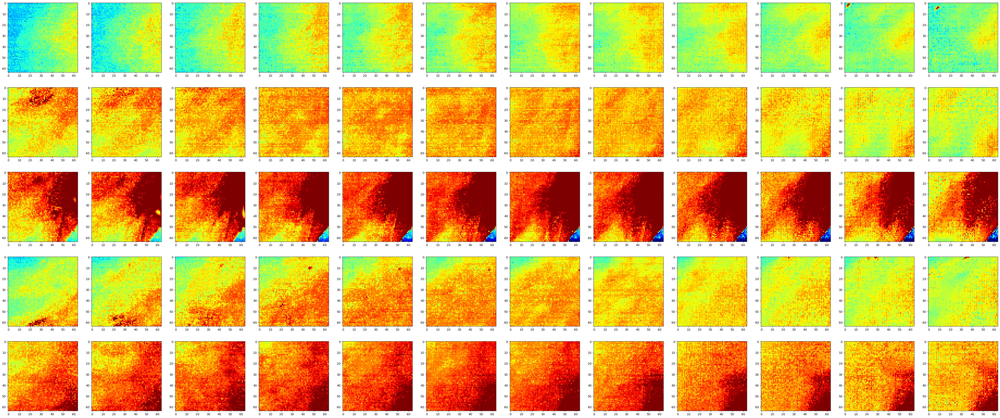

In [6]:
valid_dataset = NcDataset(is_train=False,
                        root='./data/',
                        n_frames_input=6,
                        n_frames_output=6)
batch_size = 5
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)

# plot the first batch of the validation set
for batch_idx, (i, targets, inputs) in enumerate(valid_loader):
    inputs = inputs.float().to(device)
    targets = targets.float().to(device)
    print(inputs.shape, targets.shape, inputs.max(), inputs.min())
    images = torch.cat([inputs, targets], dim=1)
    _, axarr = plt.subplots(images.shape[0], images.shape[1], figsize=(images.shape[1]*batch_size, images.shape[0]*batch_size))
    for b in range(images.shape[0]):
        for n in range(images.shape[1]):
            plot_img = images[b, n, 0].cpu().numpy()
            axarr[b][n].imshow(np.flip(plot_img, axis=0), cmap='jet', vmin=0, vmax=0.2)
    break

checkpoint_10_0.000606.pth.tar
Plotting Sample 0 in batch 0...


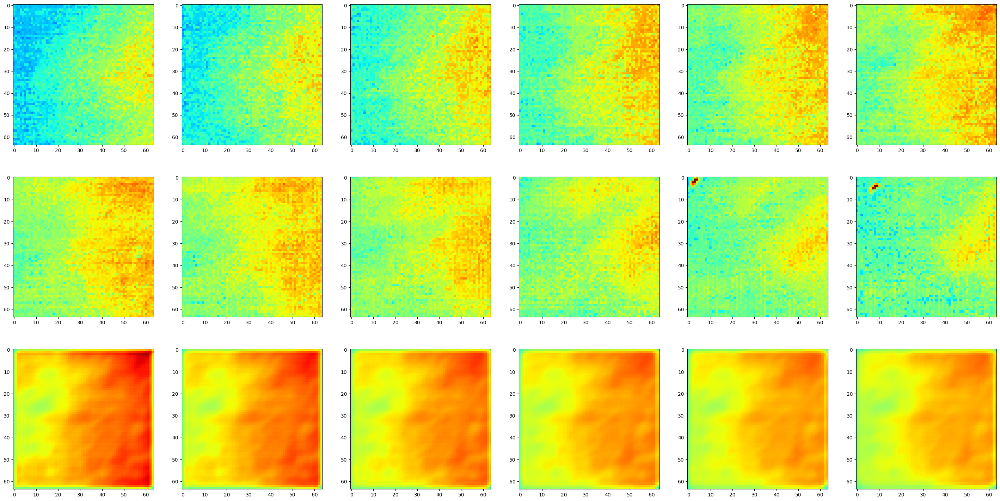

Plotting Sample 1 in batch 0...


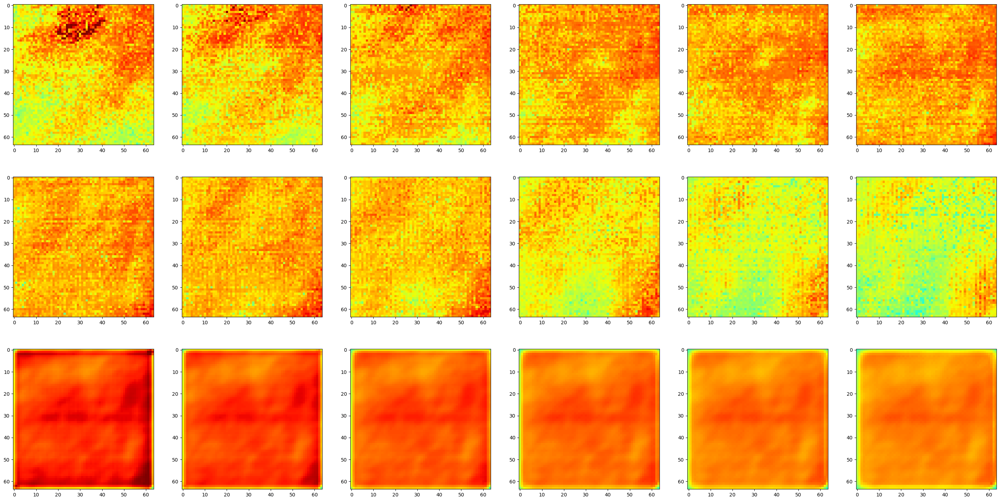

Plotting Sample 2 in batch 0...


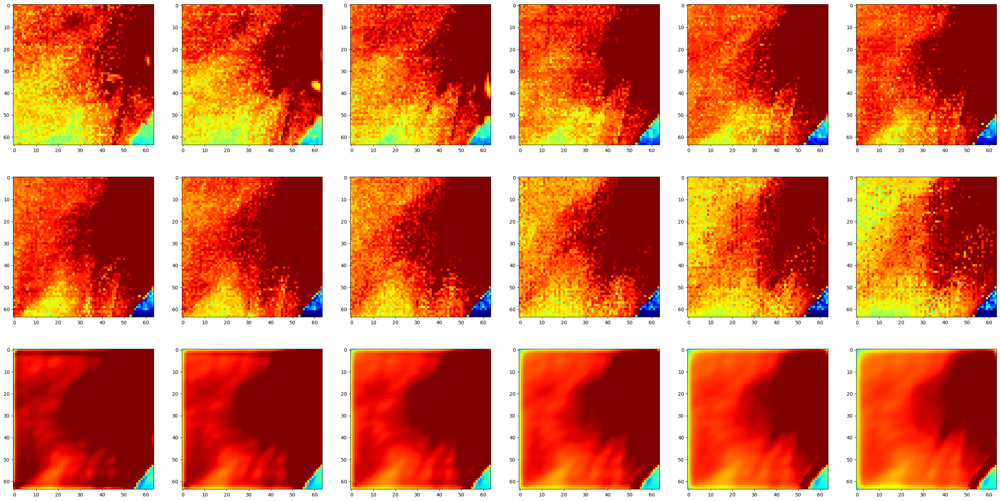

Plotting Sample 3 in batch 0...


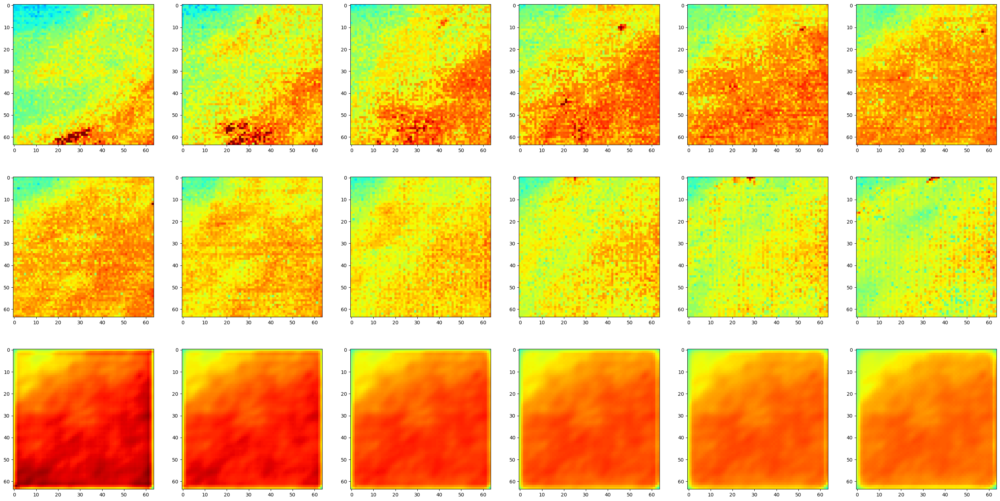

Plotting Sample 4 in batch 0...


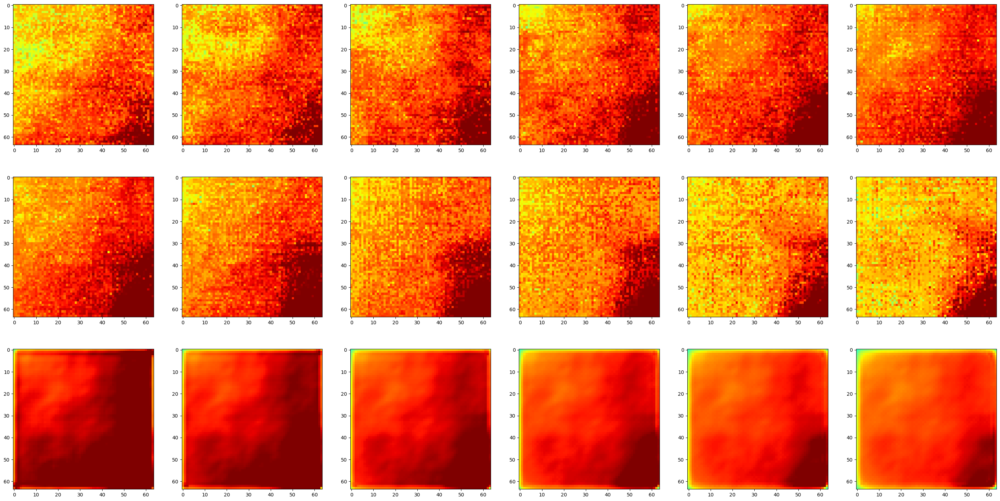

Plotting Sample 0 in batch 1...


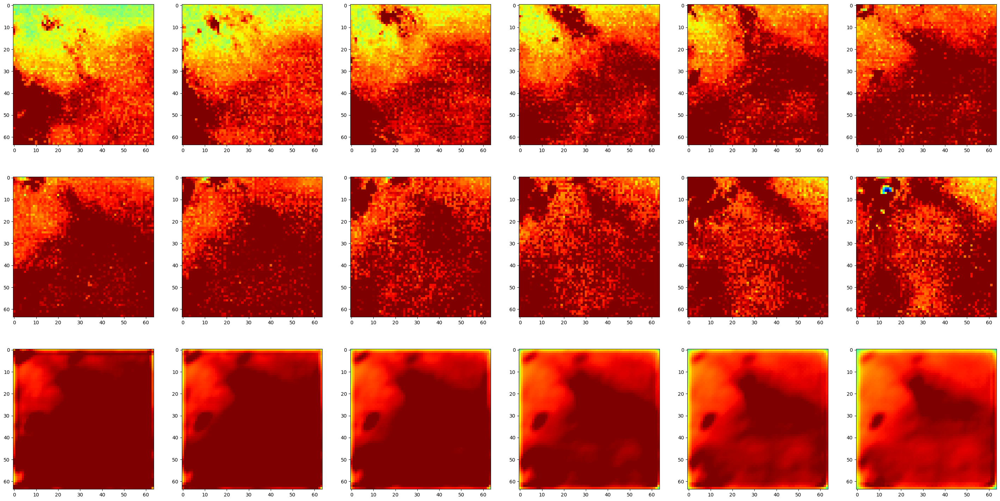

Plotting Sample 1 in batch 1...


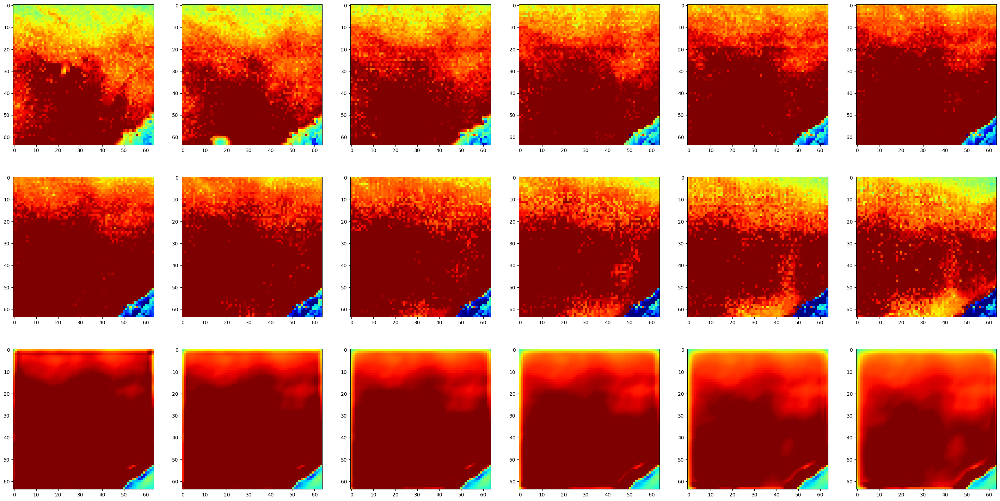

Plotting Sample 2 in batch 1...


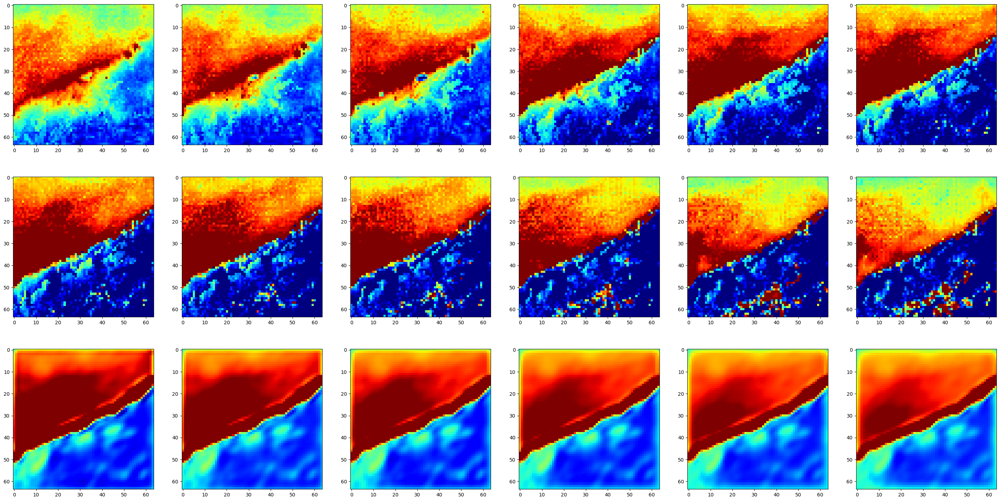

Plotting Sample 3 in batch 1...


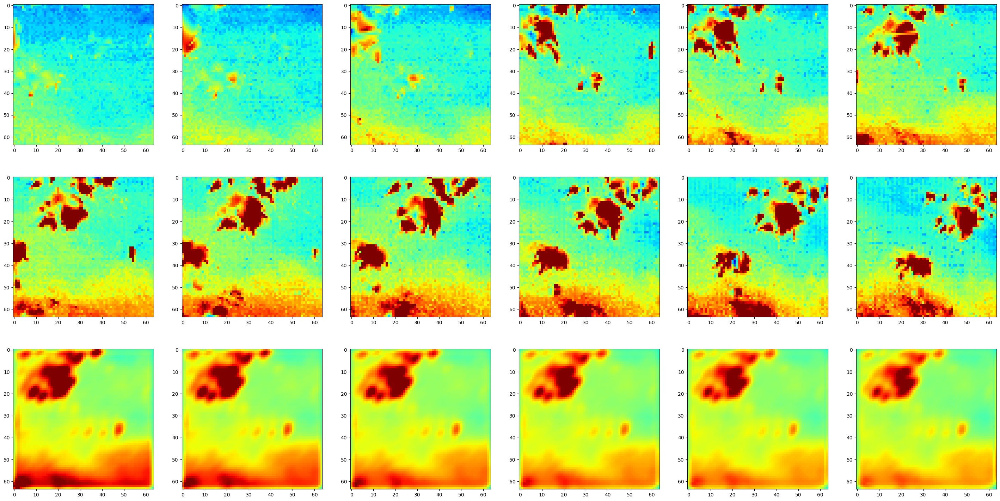

Plotting Sample 4 in batch 1...


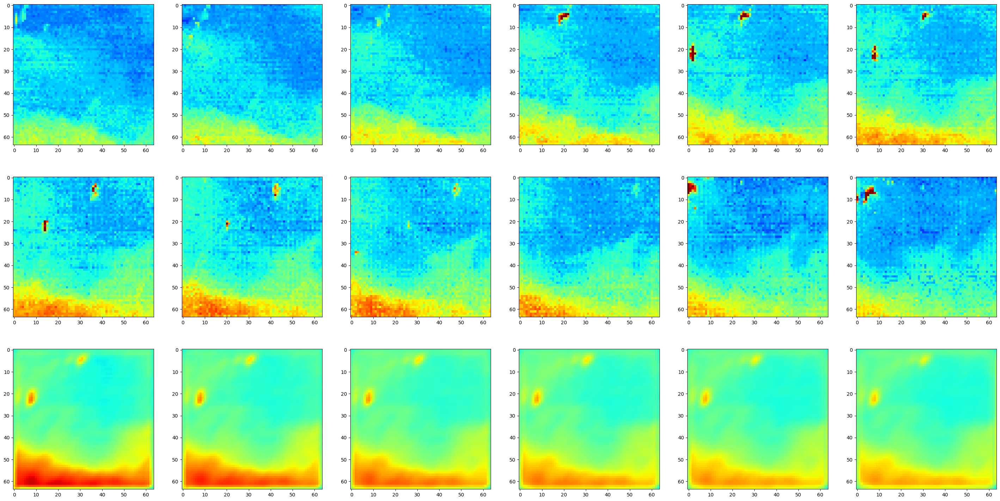

Plotting Sample 0 in batch 2...


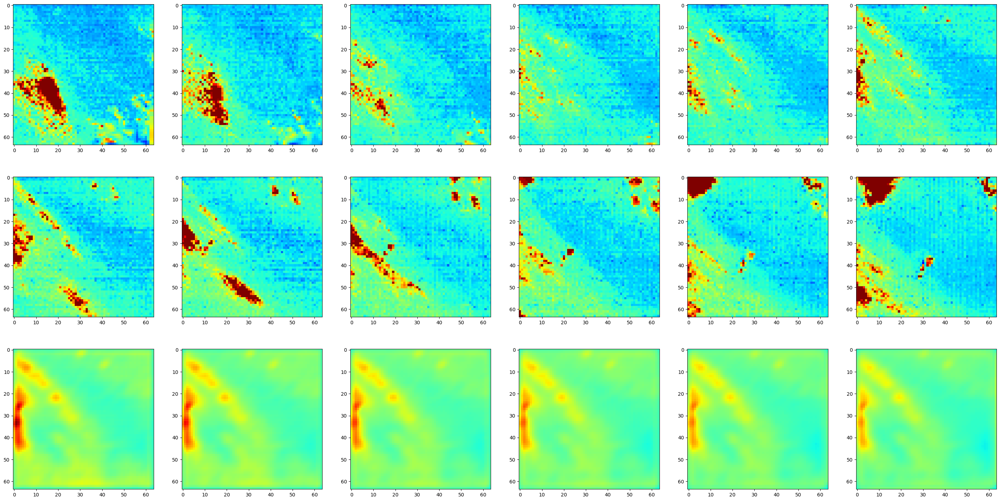

Plotting Sample 1 in batch 2...


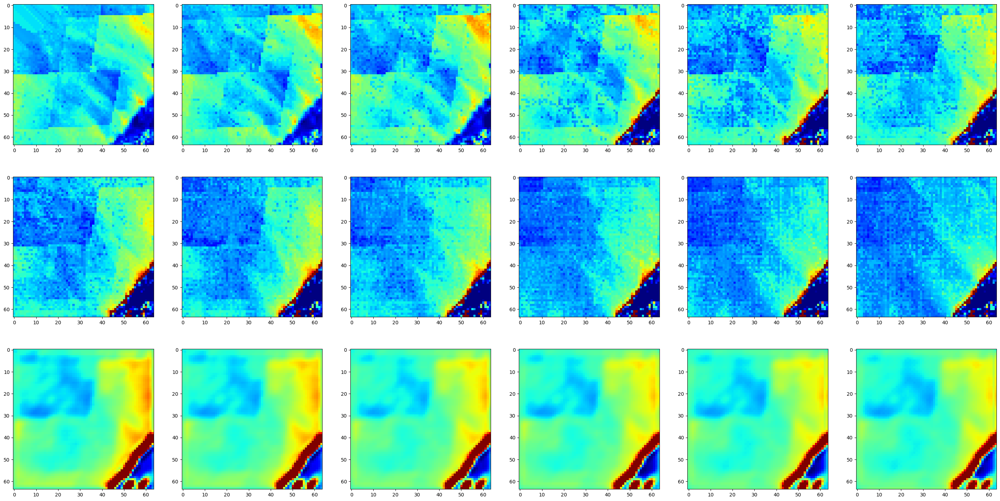

Plotting Sample 2 in batch 2...


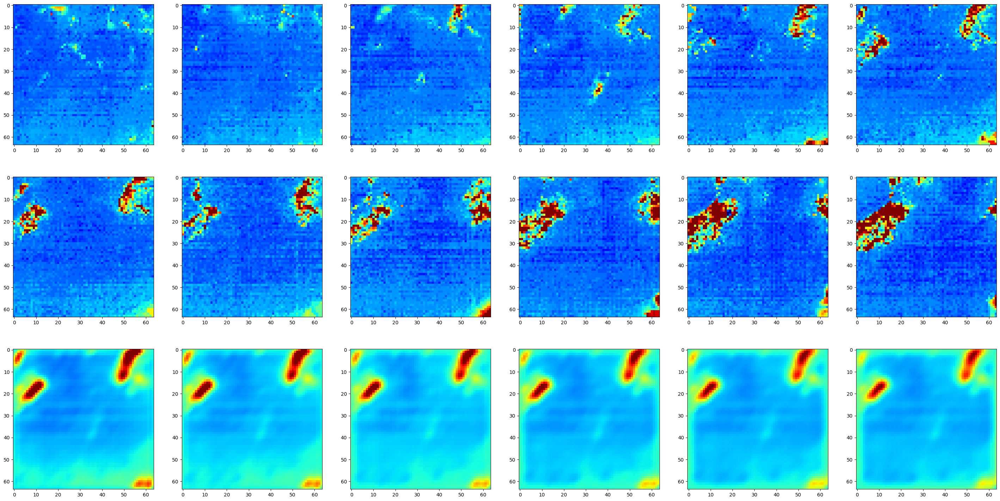

Plotting Sample 3 in batch 2...


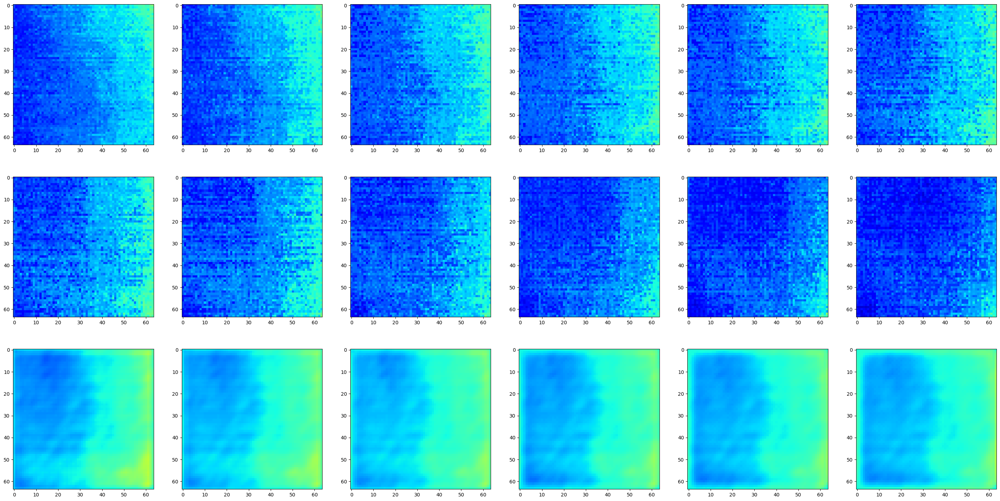

Plotting Sample 4 in batch 2...


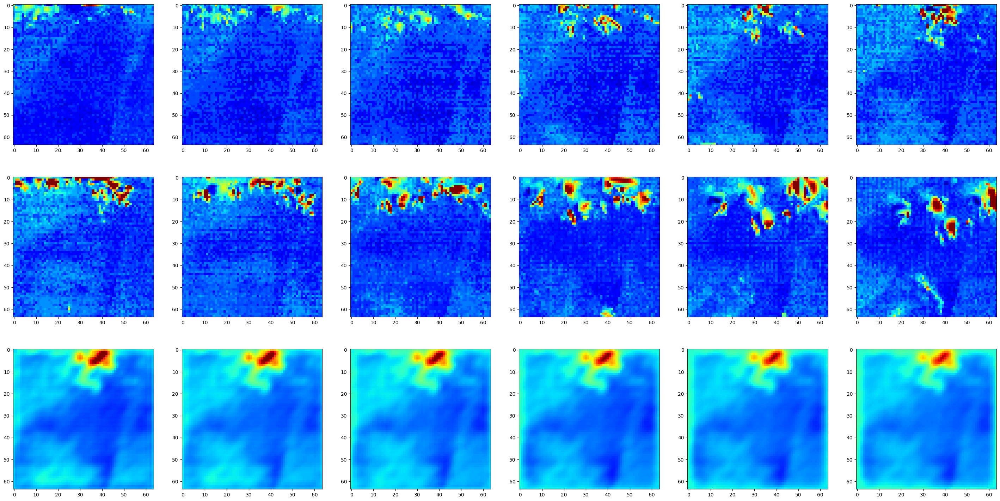

Plotting Sample 0 in batch 3...


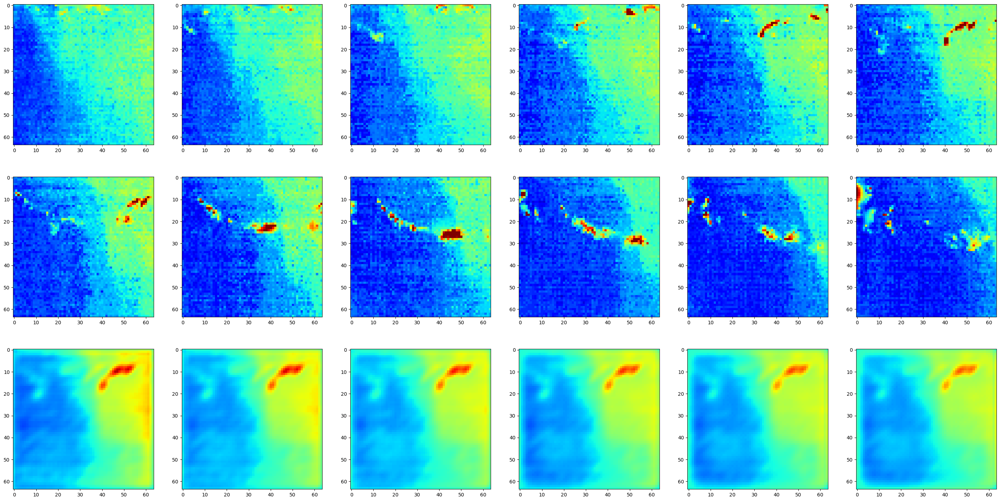

Plotting Sample 1 in batch 3...


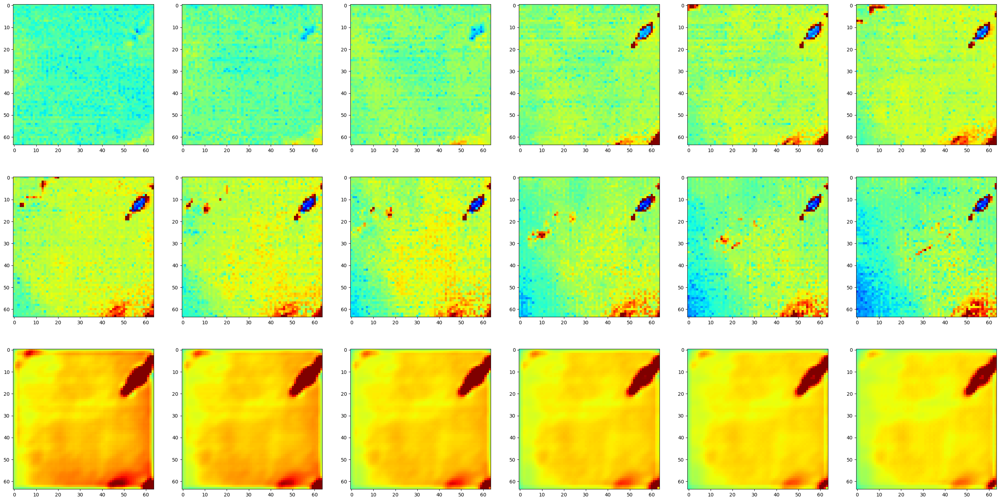

Plotting Sample 2 in batch 3...


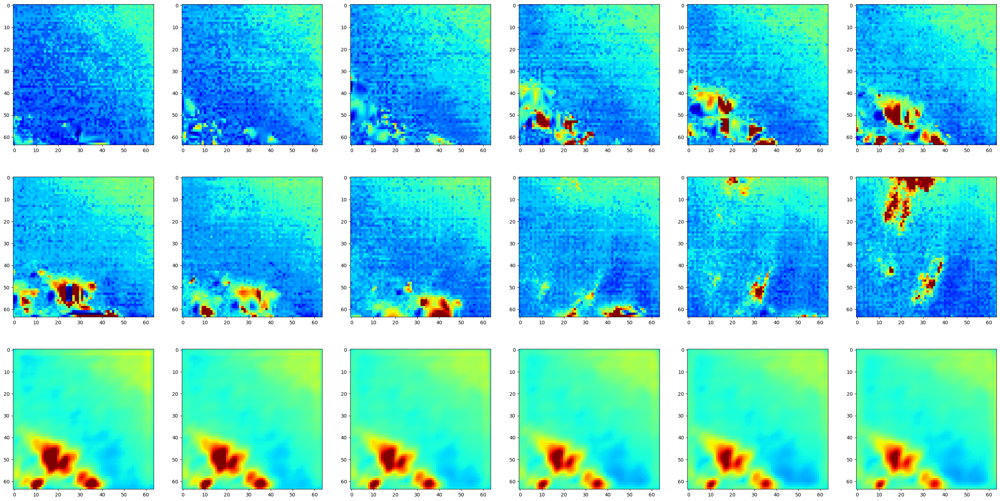

Plotting Sample 3 in batch 3...


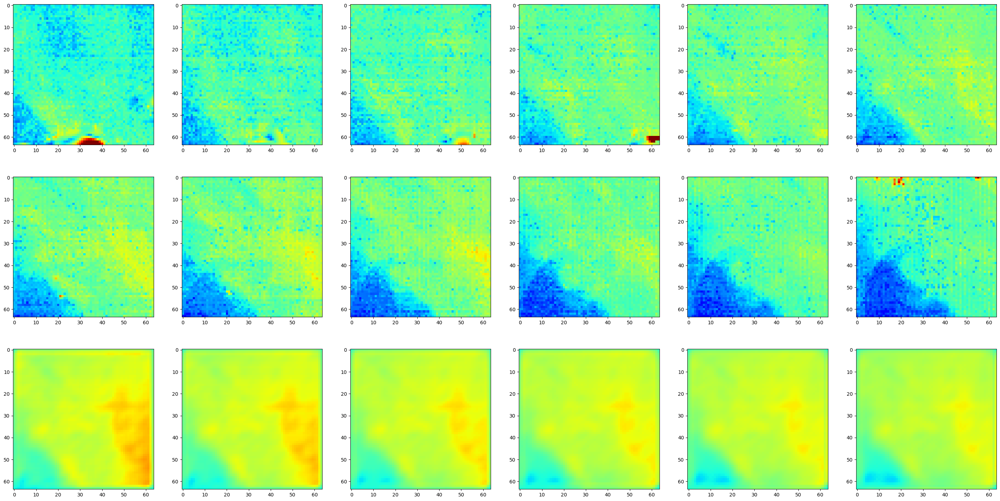

Plotting Sample 4 in batch 3...


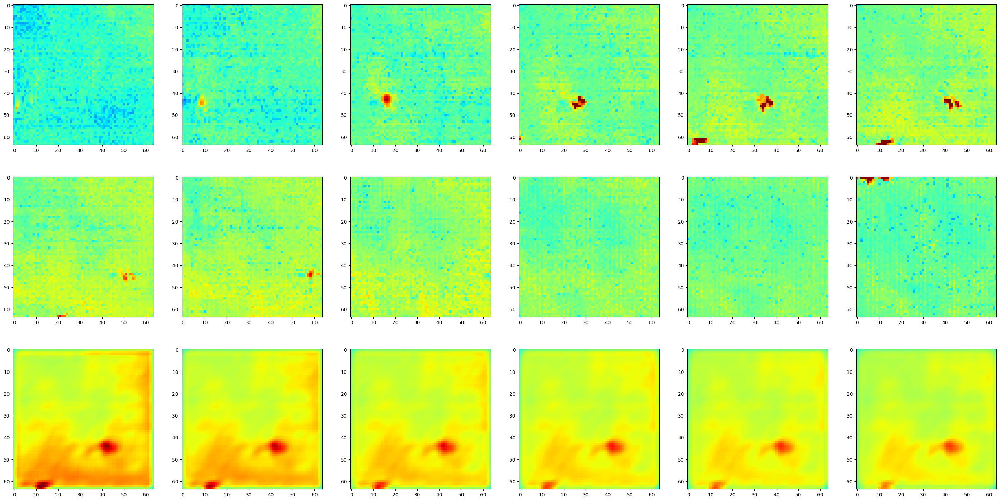

Plotting Sample 0 in batch 4...


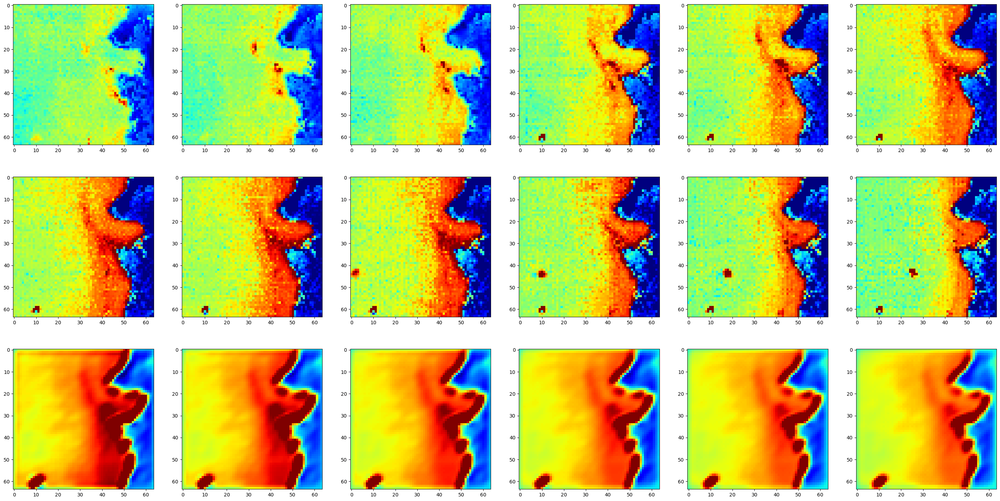

Plotting Sample 1 in batch 4...


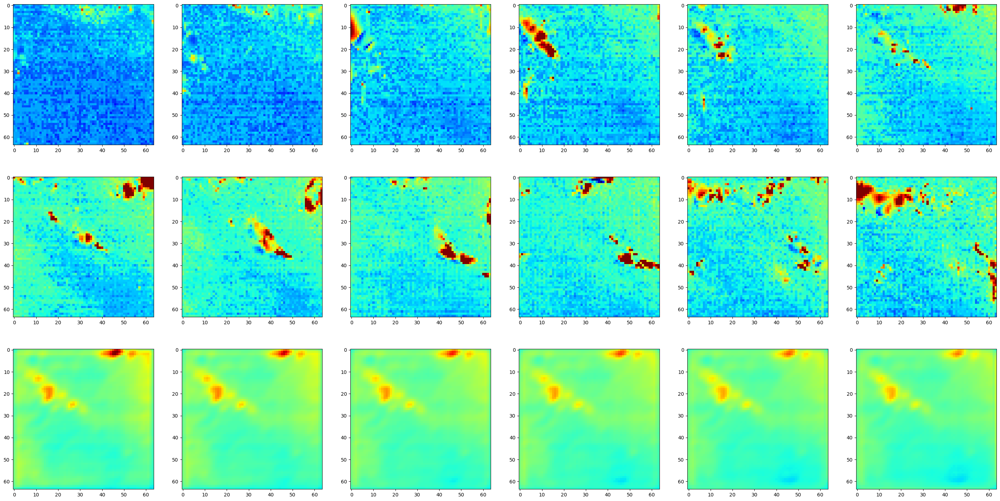

Plotting Sample 2 in batch 4...


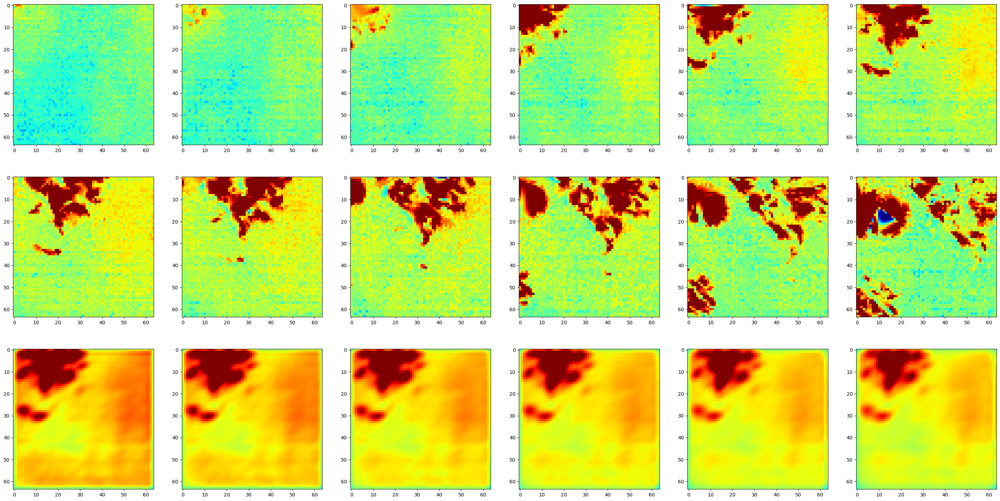

Plotting Sample 3 in batch 4...


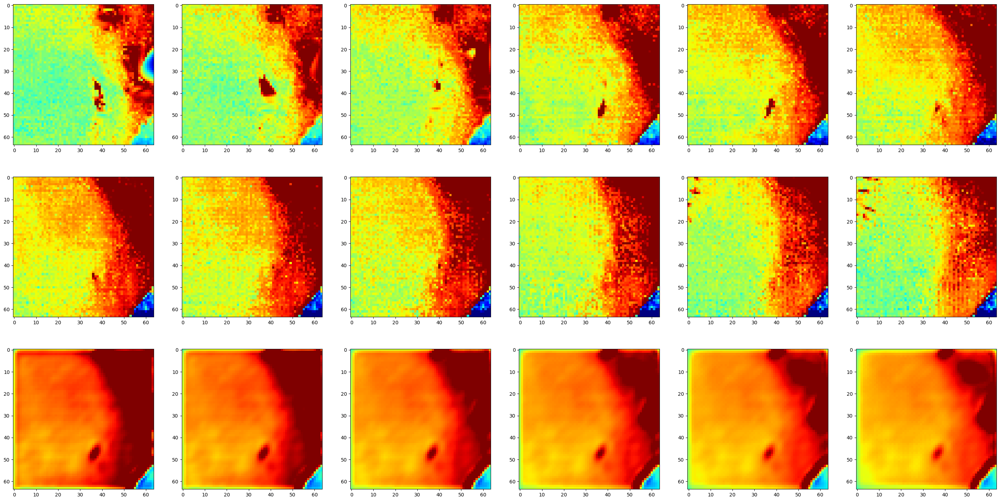

Plotting Sample 4 in batch 4...


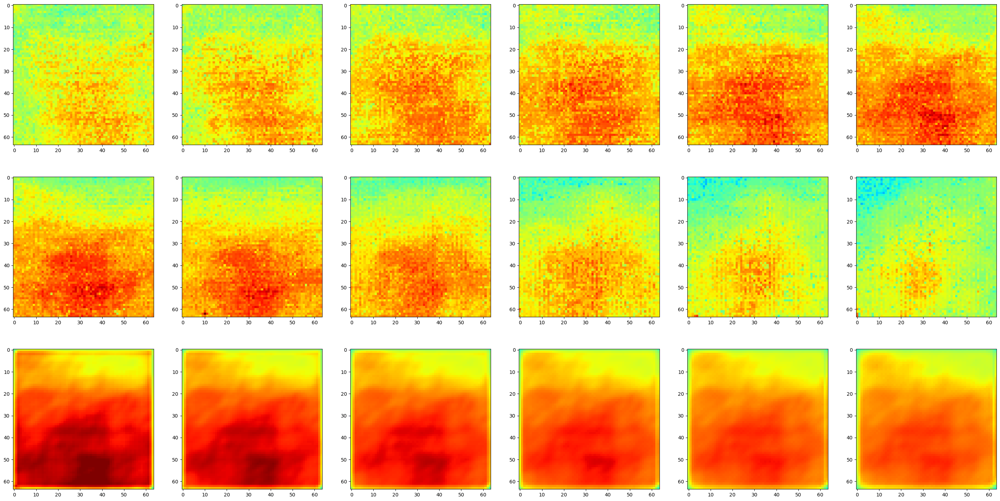

In [7]:
# compare targets with predictions
import os
from encoder import Encoder
from decoder import Decoder
from model import ED
from net_params import convlstm_encoder_params, convlstm_decoder_params, convgru_encoder_params, convgru_decoder_params


TIMESTAMP = "2023-09-16"
base_cell = 'convgru' # convlstm or convgru
checkpoints_dir = f'save_model/{TIMESTAMP}_{base_cell}/'
all_checkpoints = os.listdir(checkpoints_dir)
all_checkpoints.sort()
# get the lowest loss checkpoint
losses = []
for checkpoint in all_checkpoints:
    loss = checkpoint.split('_')[-1][:8]
    losses.append(float(loss))
lowest_loss_checkpoint = all_checkpoints[np.argmin(losses)]
print(lowest_loss_checkpoint)

# initialize the network
if base_cell == 'convlstm':
    convlstm_bool = True
elif base_cell == 'convgru':
    convlstm_bool = False
else:
    raise ValueError(f"Invalid base cell: {base_cell}")
encoder_params = convlstm_encoder_params if convlstm_bool else convgru_encoder_params
decoder_params = convlstm_decoder_params if convlstm_bool else convgru_decoder_params
encoder = Encoder(encoder_params[0], encoder_params[1]).to(device)
decoder = Decoder(decoder_params[0], decoder_params[1]).to(device)
net = ED(encoder, decoder)
net = net.to(device)
# load the checkpoint
model_info = torch.load(os.path.join(checkpoints_dir, lowest_loss_checkpoint))
net.load_state_dict(model_info['state_dict'])

# plot some samples
# define which batches to plot, there are 300/10=30 batches in total
to_plot_batch_idx = [0, 1, 2, 3, 4] # this will plot the first 5 batches
for batch_idx, (i, targets, inputs) in enumerate(valid_loader):
    if batch_idx not in to_plot_batch_idx:
        continue
    inputs = inputs.float().to(device)
    targets = targets.float().to(device)
    outputs = net(inputs)
    # 3 rows: inputs, targets, outputs
    for j in range(batch_size):
        print(f"Plotting Sample {j} in batch {batch_idx}...")
        _, axarr = plt.subplots(3, 6, figsize=(6*6, 3*6))
        for n in range(6):
            plot_img = inputs[j, n, 0].cpu().numpy()
            axarr[0][n].imshow(np.flip(plot_img, axis=0), cmap='jet', vmin=0, vmax=0.2)
            plot_img = targets[j, n, 0].cpu().numpy()
            axarr[1][n].imshow(np.flip(plot_img, axis=0), cmap='jet', vmin=0, vmax=0.2)
            plot_img = outputs[j, n, 0].cpu().detach().numpy()
            axarr[2][n].imshow(np.flip(plot_img, axis=0), cmap='jet', vmin=0, vmax=0.2)
        # close the figure
        plt.show()


checkpoint_10_0.000476.pth.tar
Plotting Sample 0 in batch 0...


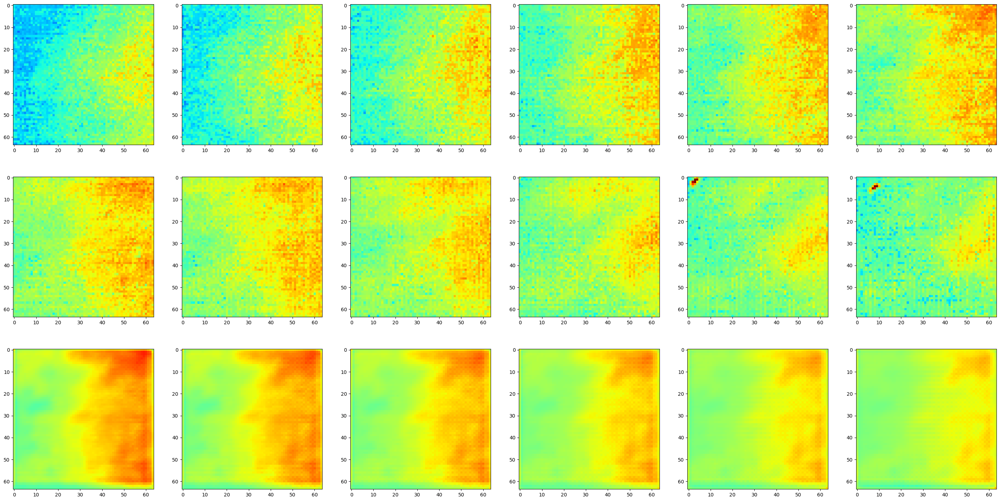

Plotting Sample 1 in batch 0...


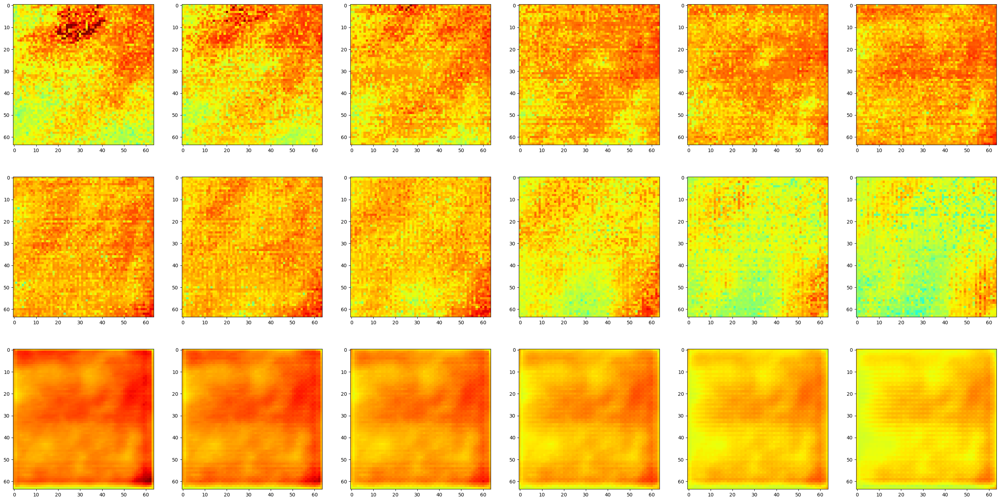

Plotting Sample 2 in batch 0...


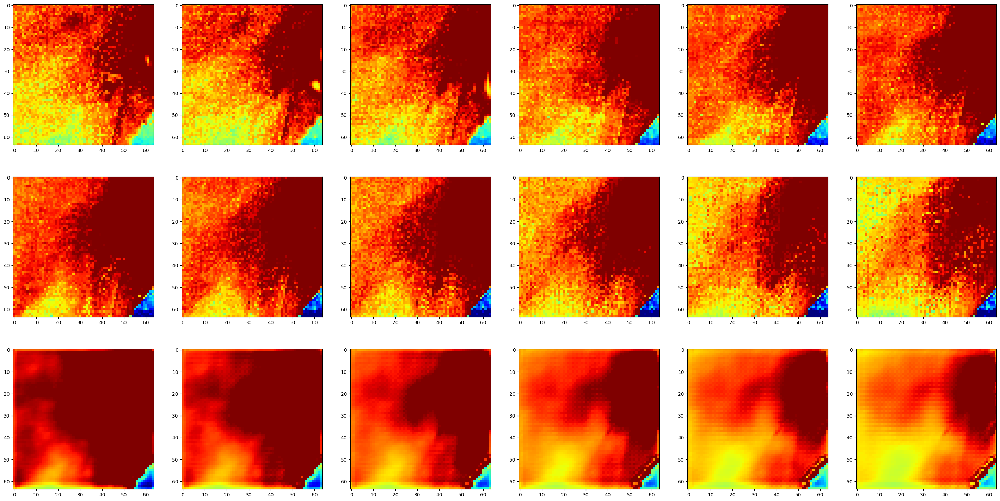

Plotting Sample 3 in batch 0...


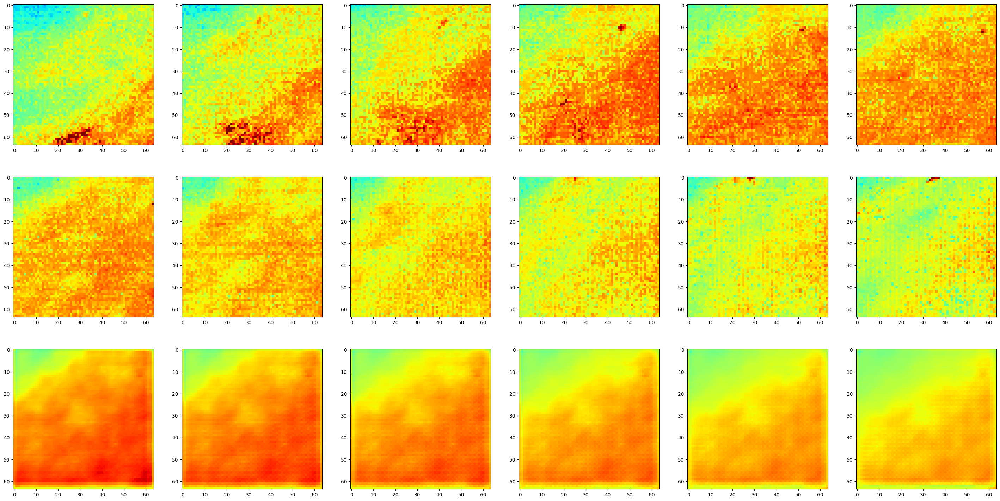

Plotting Sample 4 in batch 0...


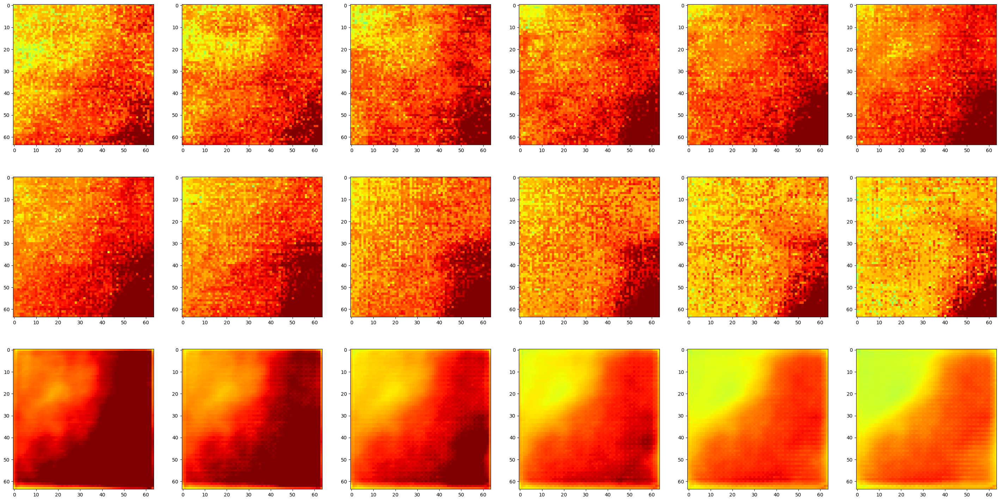

Plotting Sample 0 in batch 1...


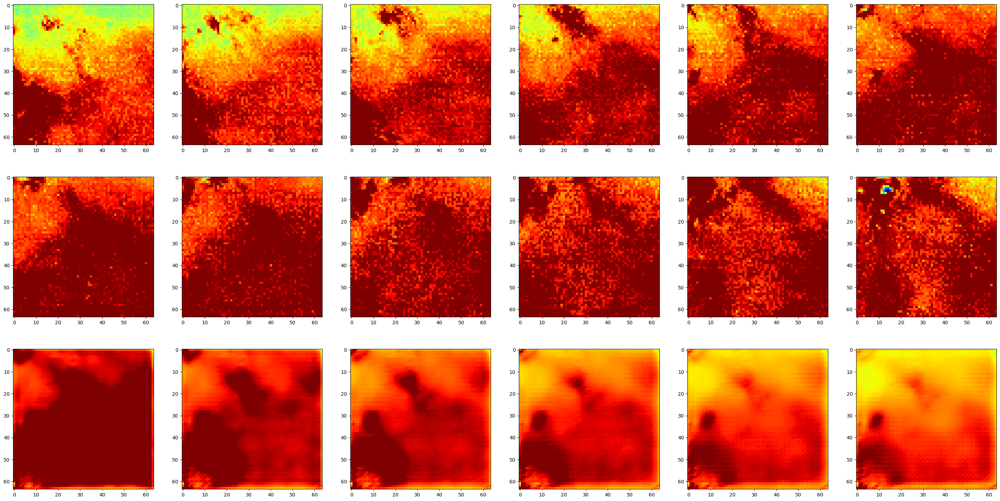

Plotting Sample 1 in batch 1...


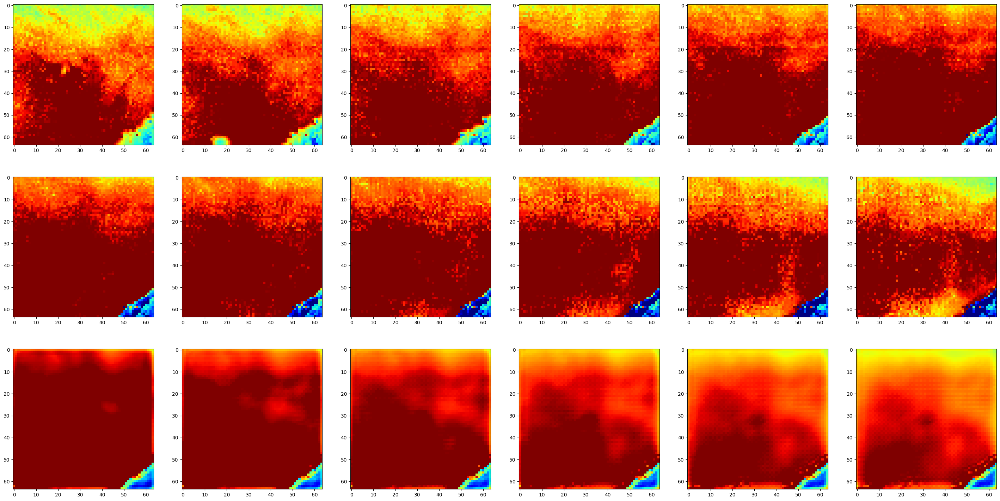

Plotting Sample 2 in batch 1...


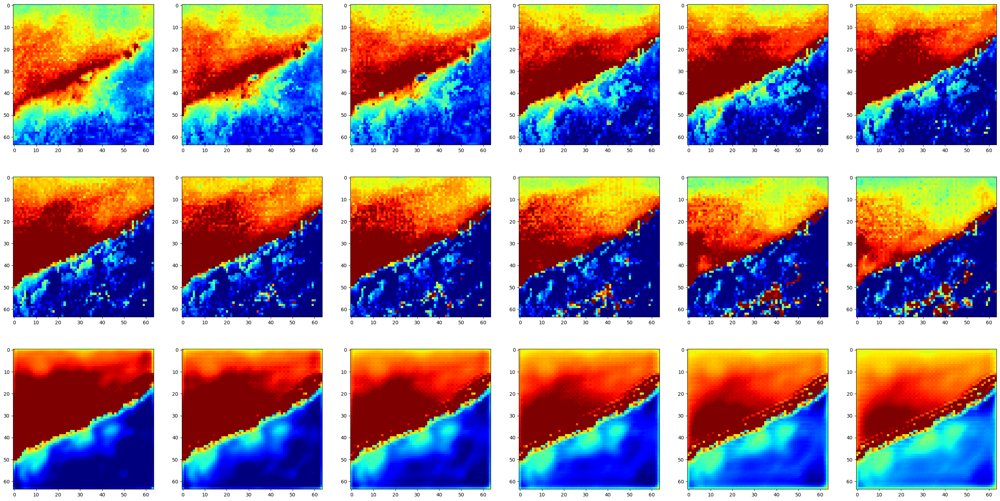

Plotting Sample 3 in batch 1...


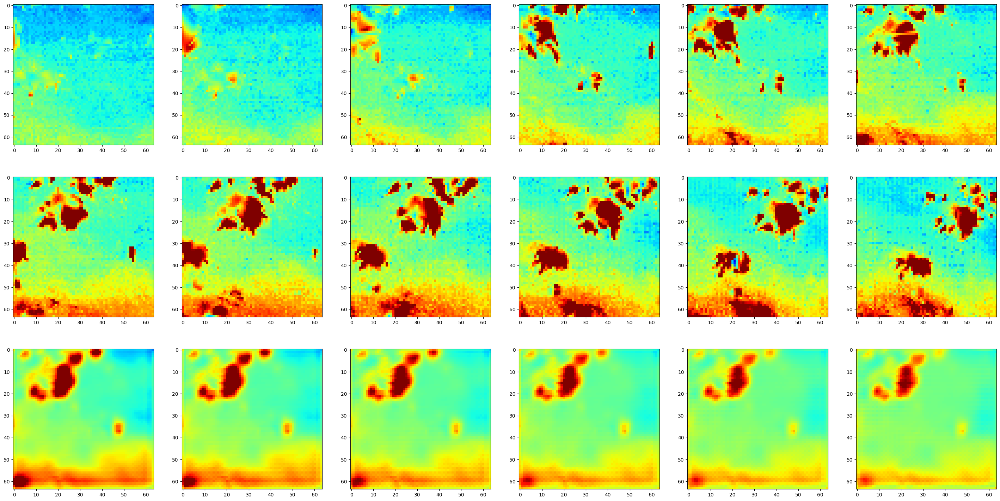

Plotting Sample 4 in batch 1...


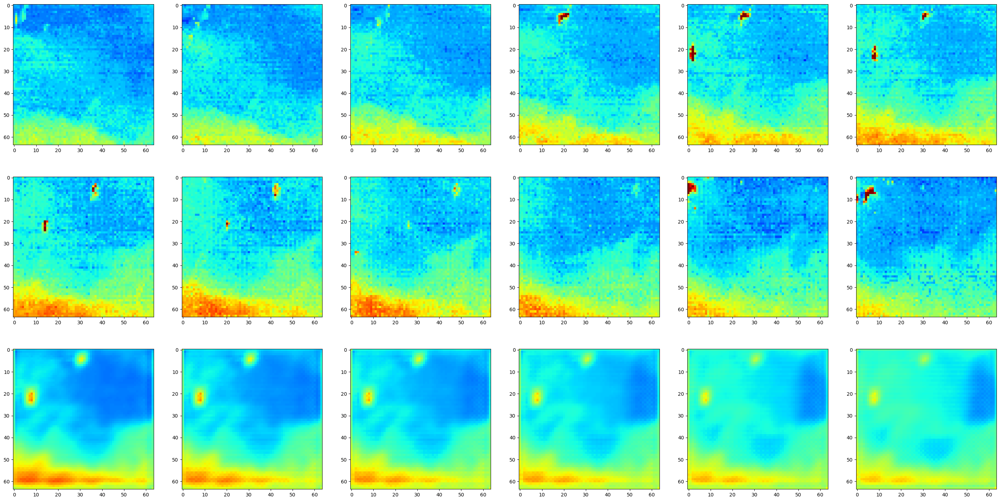

Plotting Sample 0 in batch 2...


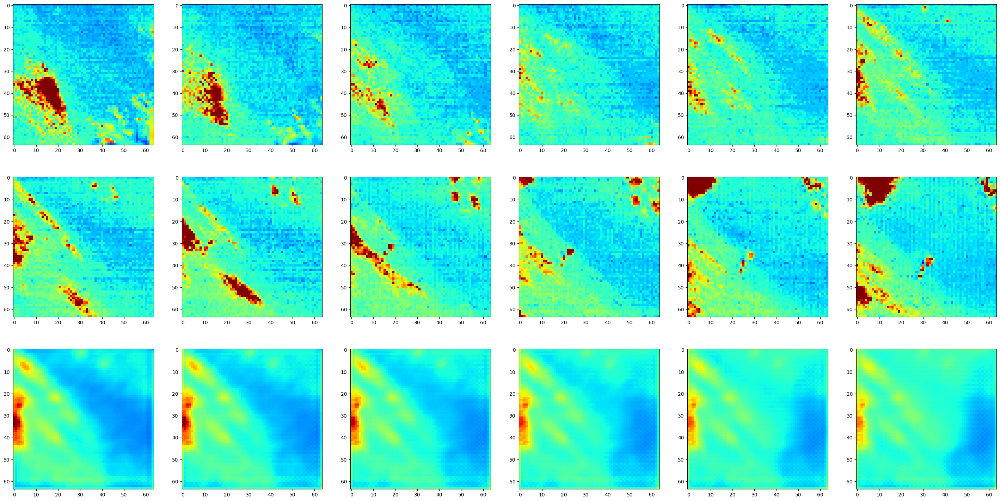

Plotting Sample 1 in batch 2...


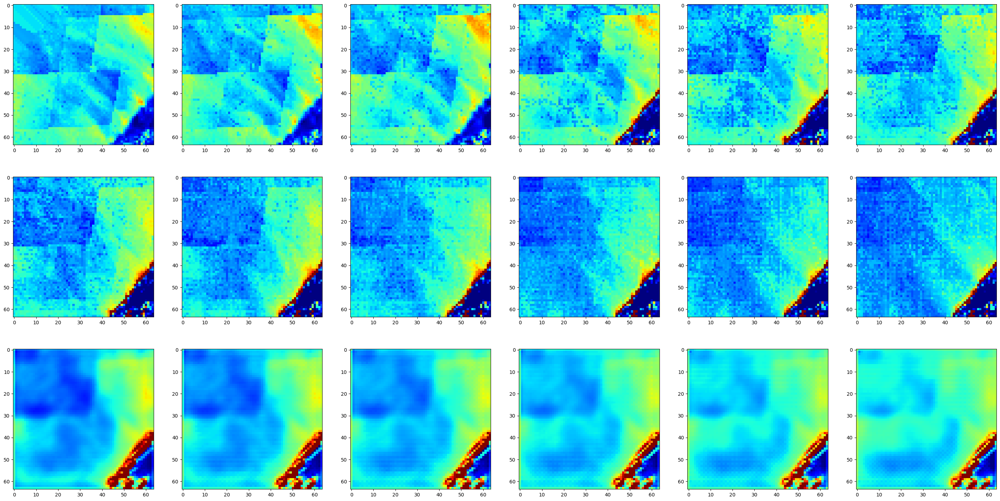

Plotting Sample 2 in batch 2...


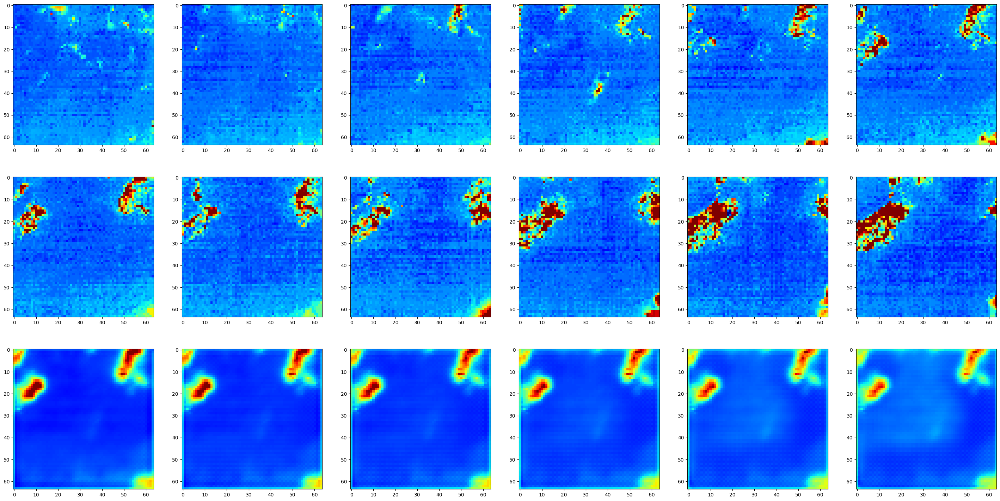

Plotting Sample 3 in batch 2...


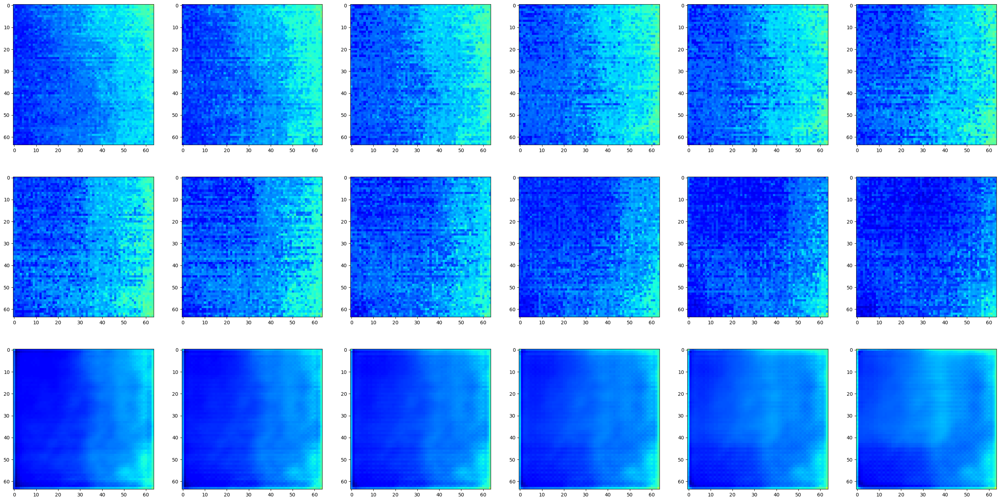

Plotting Sample 4 in batch 2...


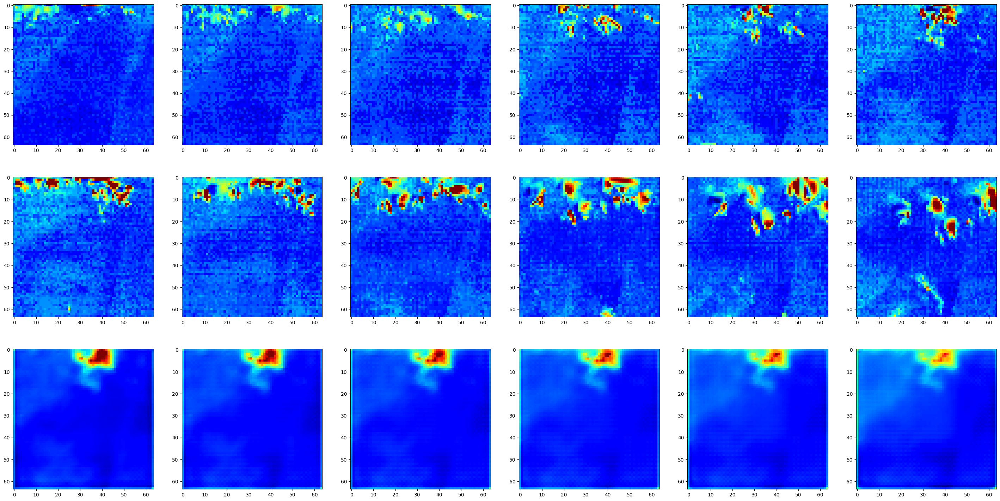

Plotting Sample 0 in batch 3...


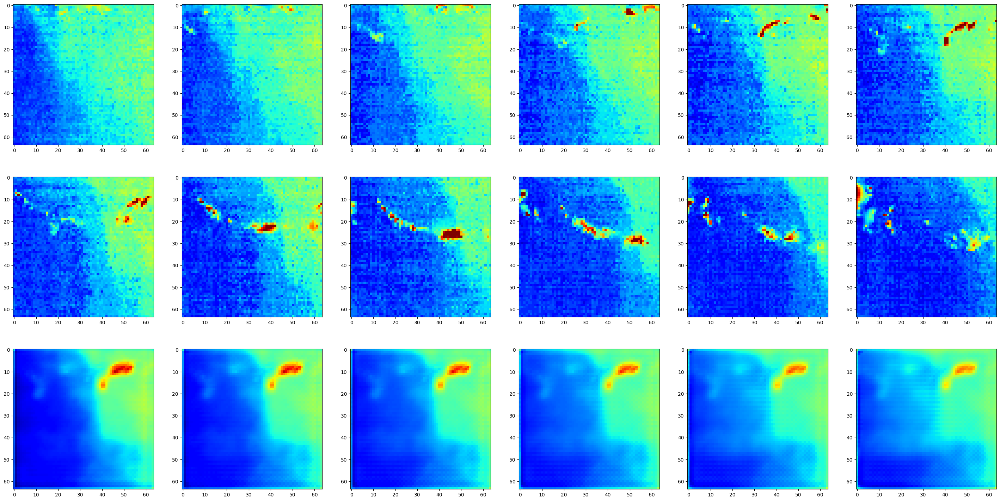

Plotting Sample 1 in batch 3...


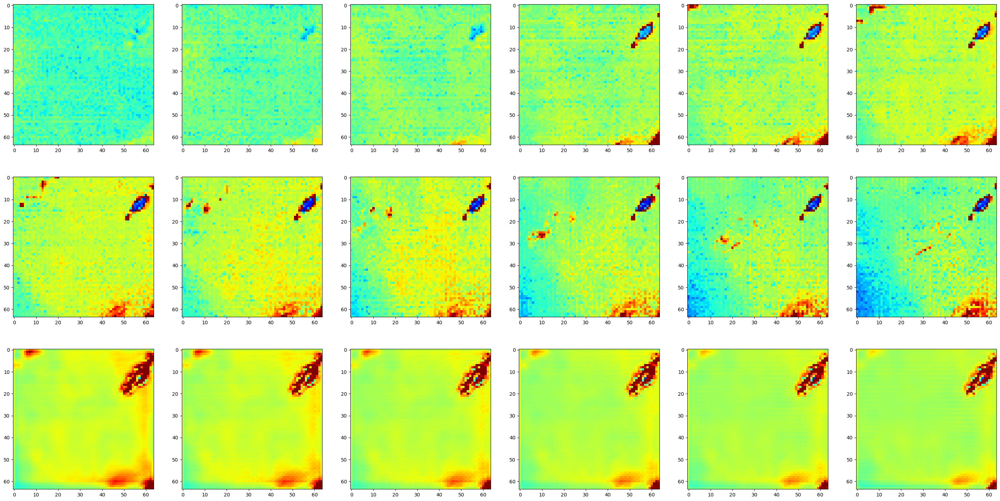

Plotting Sample 2 in batch 3...


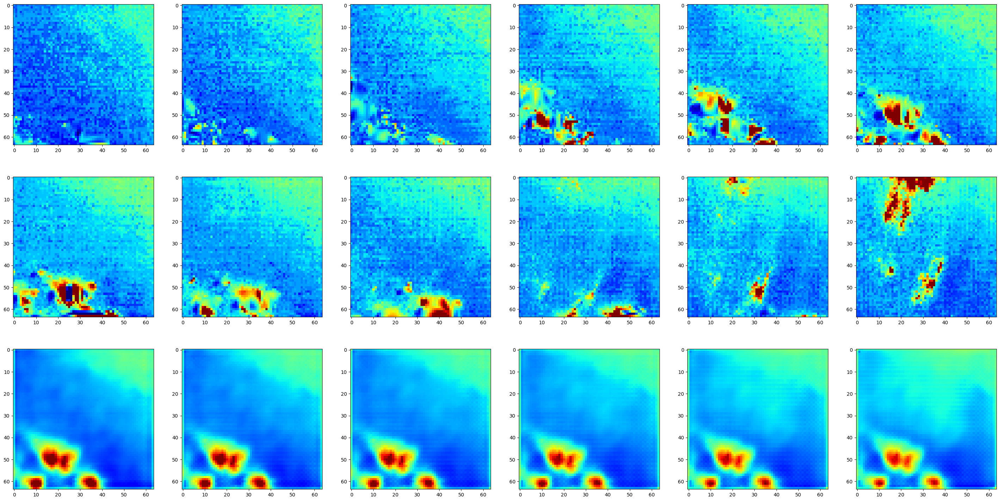

Plotting Sample 3 in batch 3...


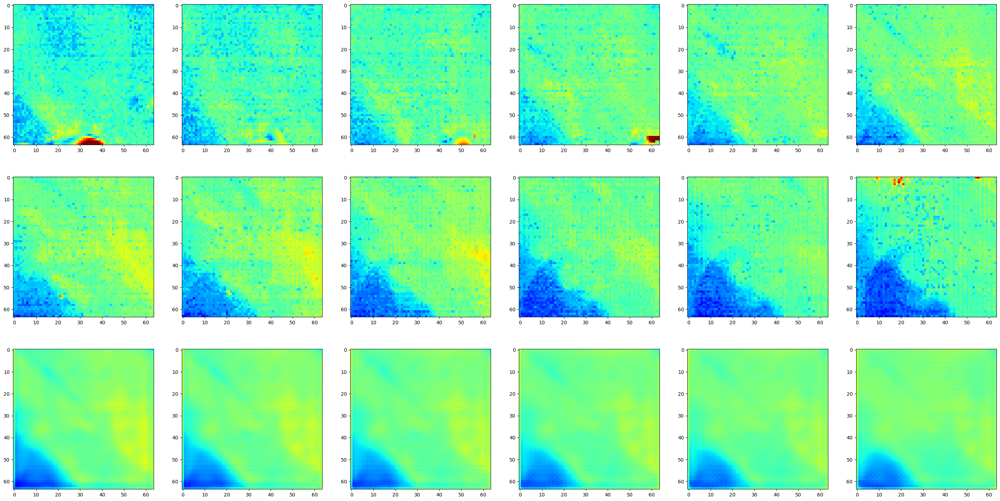

Plotting Sample 4 in batch 3...


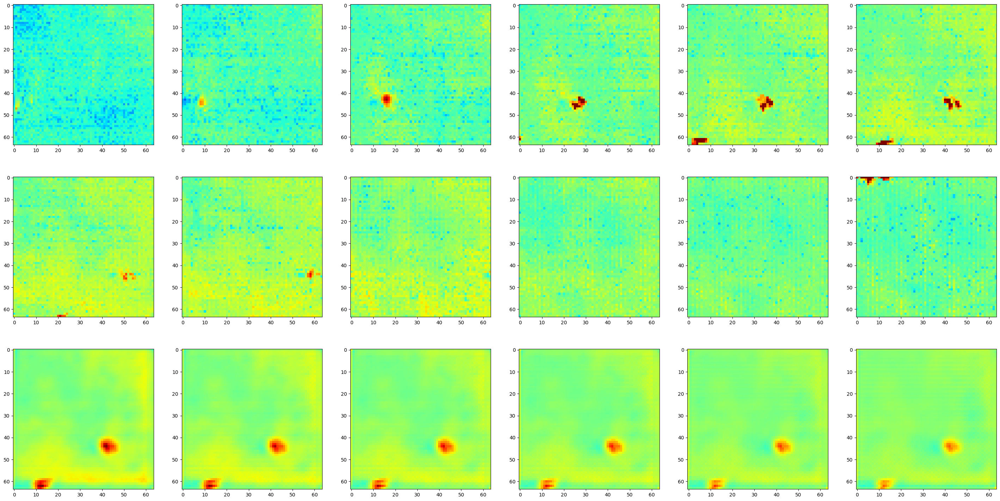

Plotting Sample 0 in batch 4...


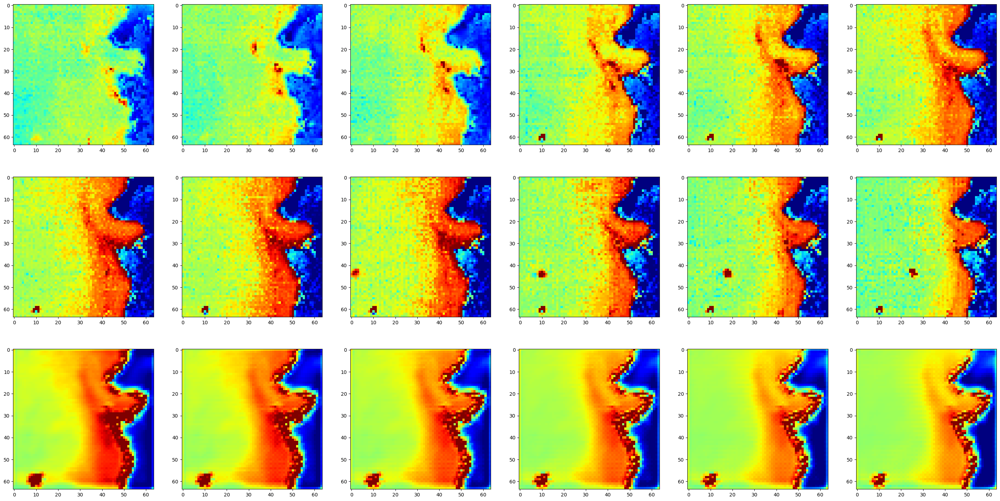

Plotting Sample 1 in batch 4...


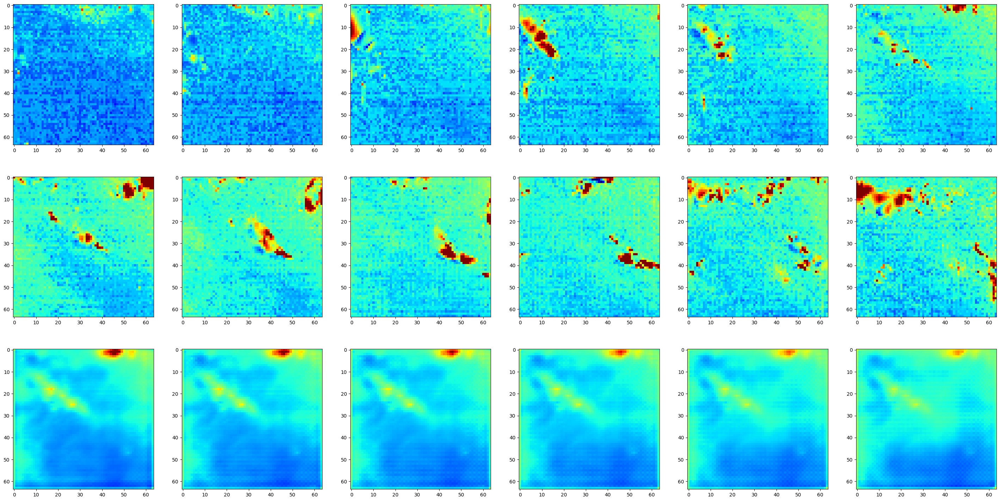

Plotting Sample 2 in batch 4...


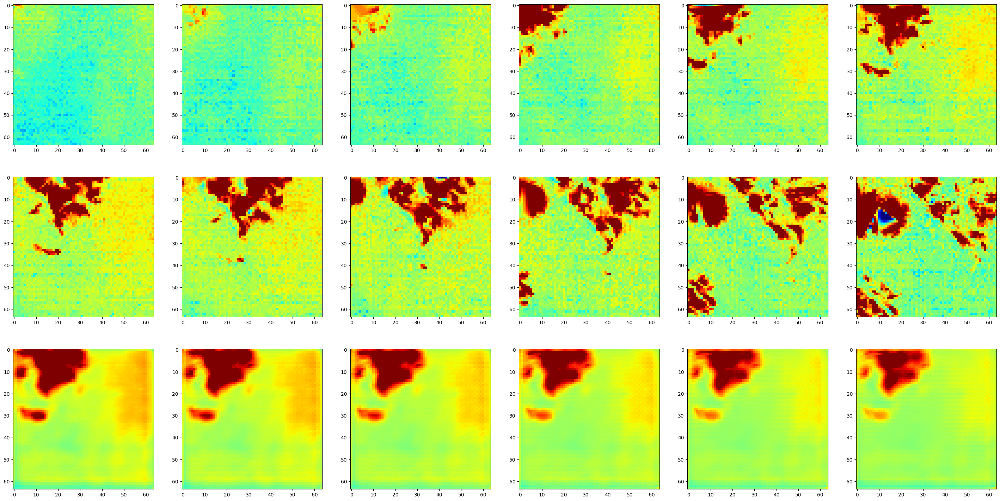

Plotting Sample 3 in batch 4...


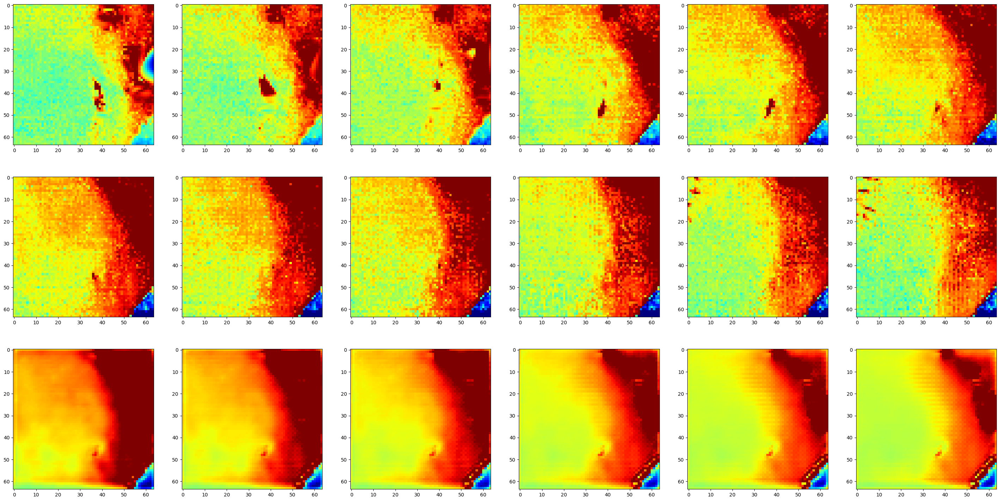

Plotting Sample 4 in batch 4...


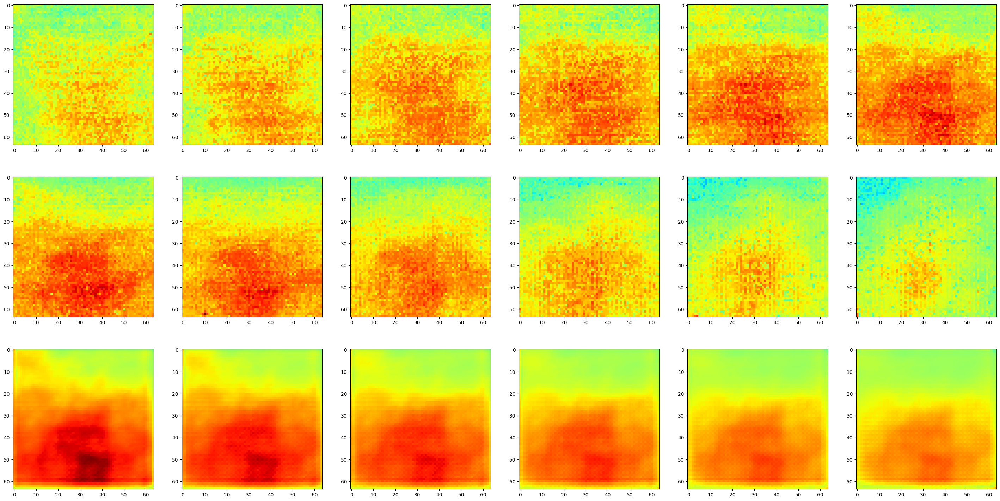

In [8]:
# plot 'convlstm' model results
base_cell = 'convlstm' # convlstm or convgru
checkpoints_dir = f'save_model/{TIMESTAMP}_{base_cell}/'
all_checkpoints = os.listdir(checkpoints_dir)
all_checkpoints.sort()
# get the lowest loss checkpoint
losses = []
for checkpoint in all_checkpoints:
    loss = checkpoint.split('_')[-1][:8]
    losses.append(float(loss))
lowest_loss_checkpoint = all_checkpoints[np.argmin(losses)]
print(lowest_loss_checkpoint)

# initialize the network
if base_cell == 'convlstm':
    convlstm_bool = True
elif base_cell == 'convgru':
    convlstm_bool = False
else:
    raise ValueError(f"Invalid base cell: {base_cell}")
encoder_params = convlstm_encoder_params if convlstm_bool else convgru_encoder_params
decoder_params = convlstm_decoder_params if convlstm_bool else convgru_decoder_params
encoder = Encoder(encoder_params[0], encoder_params[1]).to(device)
decoder = Decoder(decoder_params[0], decoder_params[1]).to(device)
net = ED(encoder, decoder)
net = net.to(device)
# load the checkpoint
model_info = torch.load(os.path.join(checkpoints_dir, lowest_loss_checkpoint))
net.load_state_dict(model_info['state_dict'])

# plot some samples
# define which batches to plot, there are 300/10=30 batches in total
to_plot_batch_idx = [0, 1, 2, 3, 4] # this will plot the first 5 batches
for batch_idx, (i, targets, inputs) in enumerate(valid_loader):
    if batch_idx not in to_plot_batch_idx:
        continue
    inputs = inputs.float().to(device)
    targets = targets.float().to(device)
    outputs = net(inputs)
    # 3 rows: inputs, targets, outputs
    for j in range(batch_size):
        print(f"Plotting Sample {j} in batch {batch_idx}...")
        _, axarr = plt.subplots(3, 6, figsize=(6*6, 3*6))
        for n in range(6):
            plot_img = inputs[j, n, 0].cpu().numpy()
            axarr[0][n].imshow(np.flip(plot_img, axis=0), cmap='jet', vmin=0, vmax=0.2)
            plot_img = targets[j, n, 0].cpu().numpy()
            axarr[1][n].imshow(np.flip(plot_img, axis=0), cmap='jet', vmin=0, vmax=0.2)
            plot_img = outputs[j, n, 0].cpu().detach().numpy()
            axarr[2][n].imshow(np.flip(plot_img, axis=0), cmap='jet', vmin=0, vmax=0.2)
        # close the figure
        plt.show()
